<a href="https://colab.research.google.com/github/georgezywang/detectron2/blob/master/fireDetect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Detectron2 Beginner's Tutorial

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to detectron2! This is the official colab tutorial of detectron2. Here, we will go through some basics usage of detectron2, including the following:
* Run inference on images or videos, with an existing detectron2 model
* Train a detectron2 model on a new dataset

You can make a copy of this tutorial by "File -> Open in playground mode" and play with it yourself. __DO NOT__ request access to this tutorial.


# Install detectron2

In [9]:
# install dependencies: 
!pip install pyyaml==5.1 'pycocotools>=2.0.1'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [10]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
assert torch.__version__.startswith("1.6")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html


In [11]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
!curl -L "https://app.roboflow.com/ds/6S40IqbOIC?key=4BFWedvoOm" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

In [12]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")

AssertionError: ignored

WARNING [10/31 18:21:13 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/31 18:21:13 d2.data.datasets.coco]: Loaded 338 images in COCO format from /content/train/_annotations.coco.json


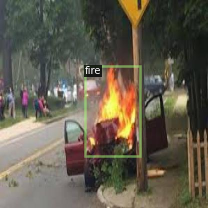

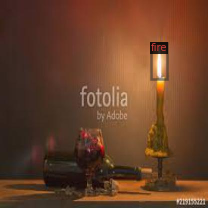

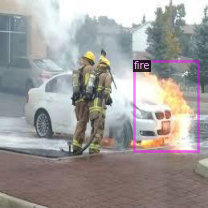

In [13]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")
import random
from detectron2.utils.visualizer import Visualizer
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [14]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.TEST.EVAL_PERIOD = 500

In [15]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
class CocoTrainer(DefaultTrainer):
  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):
    if output_folder is None:
            os.makedirs("coco_eval", exist_ok=True)
            output_folder = "coco_eval"
    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [16]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok = True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume = True)
trainer.train()

[10/31 18:21:21 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [17]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


/usr/local/lib/python3.6/dist-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  return x.nonzero().unbind(1)


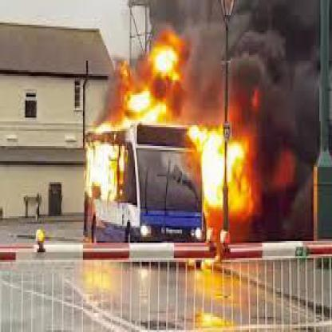

{'instances': Instances(num_instances=3, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[9.4502e-04, 1.3501e-02, 5.6517e-01, 2.5398e+00],
        [6.2684e-03, 4.1448e+02, 3.2678e+00, 4.1600e+02],
        [2.1261e+02, 3.0157e+02, 3.2329e+02, 3.8076e+02]], device='cuda:0')), scores: tensor([0.0102, 0.0064, 0.0060], device='cuda:0'), pred_classes: tensor([0, 0, 0], device='cuda:0')])}


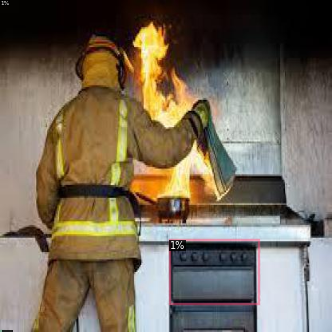

{'instances': Instances(num_instances=3, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[  0.0000, 278.3213, 415.0254, 413.9232],
        [ 88.4034, 219.3924, 290.2519, 415.9856],
        [ 35.9574, 198.4018, 120.8149, 264.6722]], device='cuda:0')), scores: tensor([0.0180, 0.0063, 0.0053], device='cuda:0'), pred_classes: tensor([0, 0, 0], device='cuda:0')])}


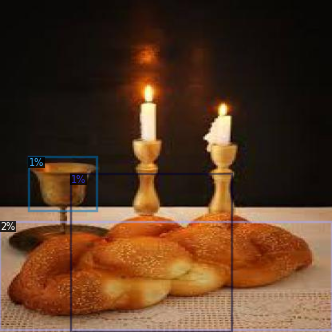

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


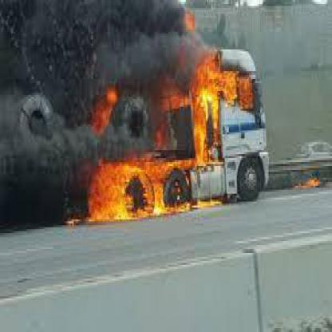

{'instances': Instances(num_instances=2, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[5.9512e-03, 4.1547e+02, 2.6825e+00, 4.1600e+02],
        [1.9991e+02, 3.8048e+01, 2.4036e+02, 1.3457e+02]], device='cuda:0')), scores: tensor([0.0059, 0.0053], device='cuda:0'), pred_classes: tensor([0, 0], device='cuda:0')])}


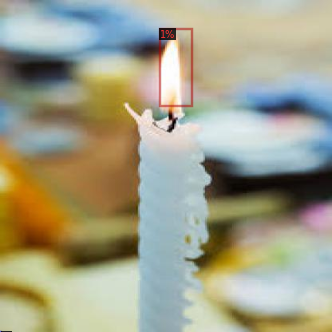

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


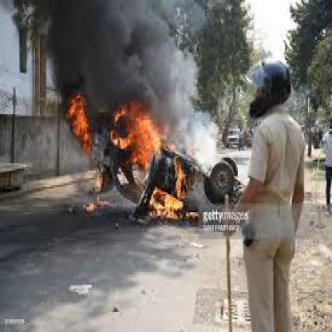

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[101.7774,  26.2832, 289.1461, 336.3582]], device='cuda:0')), scores: tensor([0.0152], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


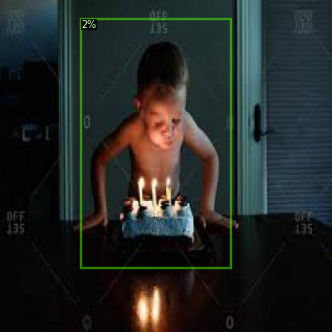

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[0.0042, 0.0014, 1.2936, 0.3600]], device='cuda:0')), scores: tensor([0.0336], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


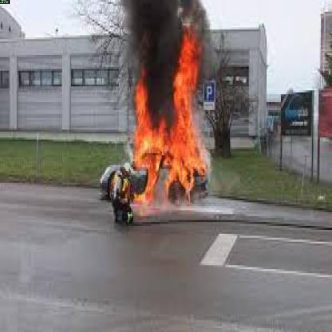

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[3.1654e-03, 4.1473e+02, 2.9547e+00, 4.1600e+02]], device='cuda:0')), scores: tensor([0.0084], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


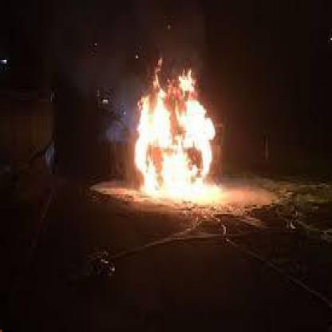

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[3.4986e-03, 4.6688e-04, 1.1727e+00, 1.1682e-01]], device='cuda:0')), scores: tensor([0.0146], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


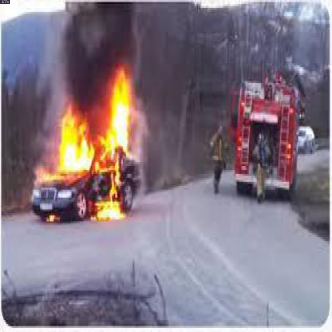

{'instances': Instances(num_instances=2, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[1.4972e-03, 1.1498e-02, 5.2059e-01, 2.7367e+00],
        [4.1262e-03, 4.1558e+02, 2.7733e+00, 4.1600e+02]], device='cuda:0')), scores: tensor([0.0138, 0.0052], device='cuda:0'), pred_classes: tensor([0, 0], device='cuda:0')])}


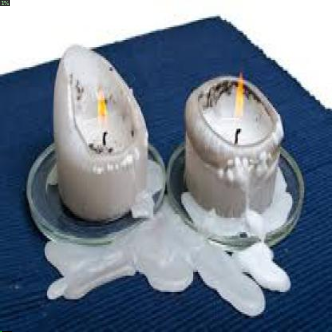

{'instances': Instances(num_instances=3, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[5.2026e-03, 1.3040e-03, 1.4137e+00, 3.2168e-01],
        [4.0623e-03, 1.3694e-02, 1.3210e+00, 3.0653e+00],
        [1.2710e+02, 2.7188e+02, 3.0649e+02, 3.5658e+02]], device='cuda:0')), scores: tensor([0.0123, 0.0077, 0.0064], device='cuda:0'), pred_classes: tensor([0, 0, 0], device='cuda:0')])}


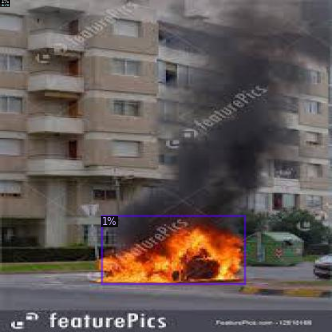

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[3.0342e-03, 4.1471e+02, 2.9065e+00, 4.1600e+02]], device='cuda:0')), scores: tensor([0.0090], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


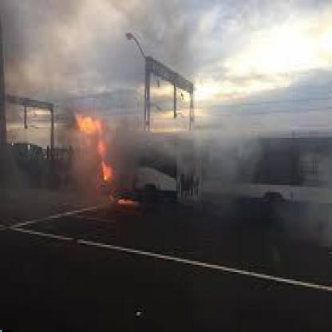

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


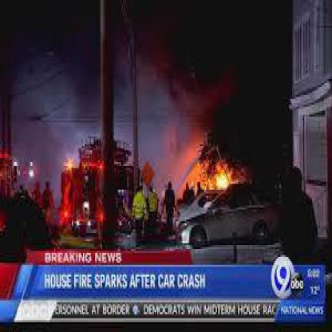

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


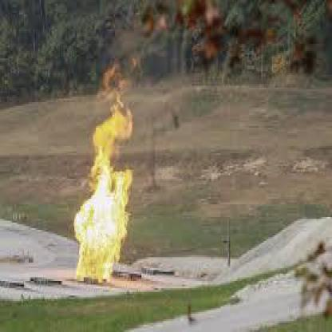

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


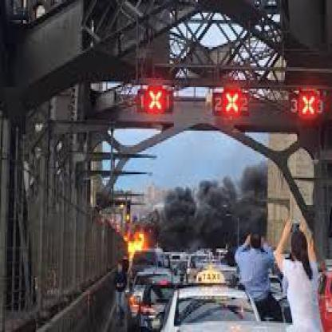

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[1.0270e-03, 1.4123e-02, 5.3568e-01, 2.6183e+00]], device='cuda:0')), scores: tensor([0.0094], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


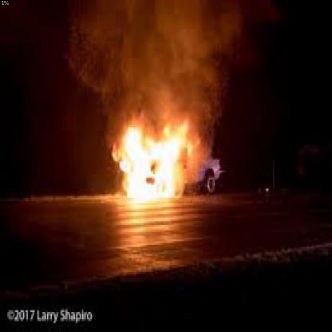

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


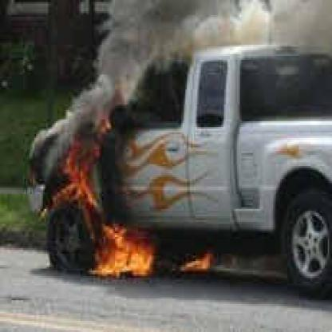

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


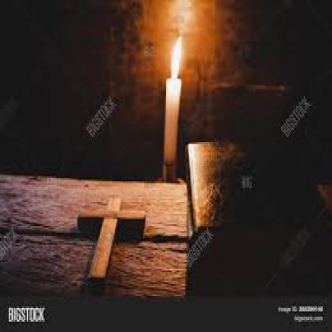

{'instances': Instances(num_instances=2, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[1.0751e-03, 1.3613e-02, 6.5909e-01, 2.5744e+00],
        [3.2573e-03, 4.1472e+02, 2.9995e+00, 4.1600e+02]], device='cuda:0')), scores: tensor([0.0100, 0.0092], device='cuda:0'), pred_classes: tensor([0, 0], device='cuda:0')])}


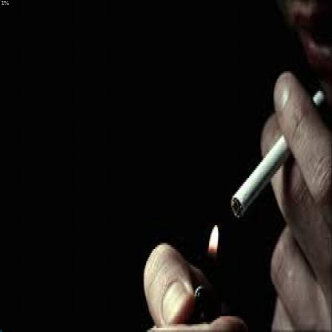

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[4.1037e+02, 7.5616e-03, 4.1600e+02, 1.8641e+00]], device='cuda:0')), scores: tensor([0.0059], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


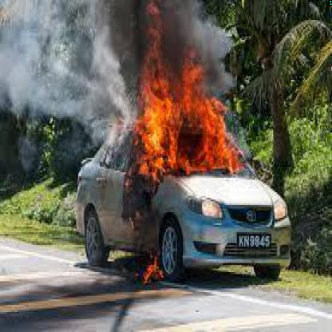

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


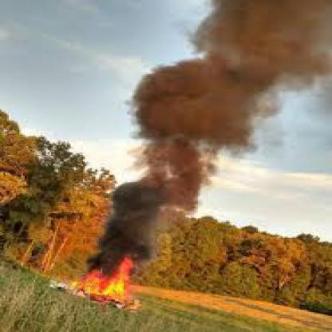

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[3.7352e-03, 4.1506e+02, 2.9276e+00, 4.1600e+02]], device='cuda:0')), scores: tensor([0.0088], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


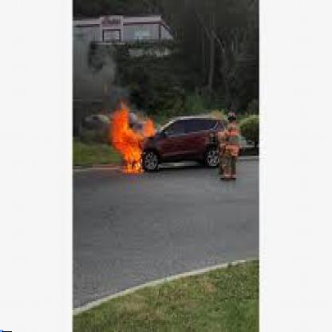

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


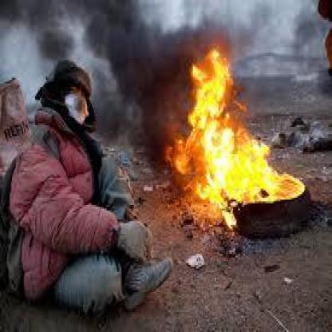

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[4.7457e-03, 4.1454e+02, 2.7184e+00, 4.1600e+02]], device='cuda:0')), scores: tensor([0.0054], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


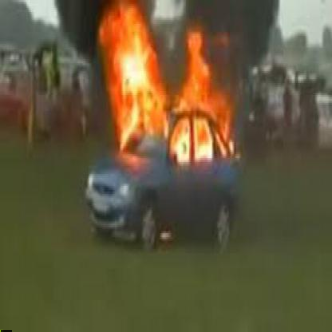

{'instances': Instances(num_instances=3, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[6.0294e-03, 4.1822e-04, 1.4594e+00, 1.8215e-01],
        [5.1105e-03, 9.4923e-03, 1.3497e+00, 3.1400e+00],
        [4.1122e+02, 3.1024e-03, 4.1600e+02, 7.0289e-01]], device='cuda:0')), scores: tensor([0.0103, 0.0059, 0.0050], device='cuda:0'), pred_classes: tensor([0, 0, 0], device='cuda:0')])}


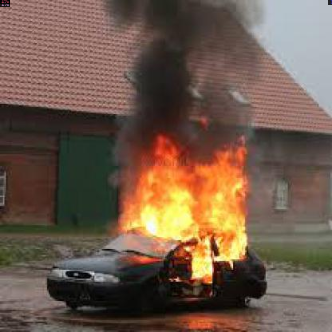

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[2.7464e-03, 4.1465e+02, 2.7390e+00, 4.1600e+02]], device='cuda:0')), scores: tensor([0.0082], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


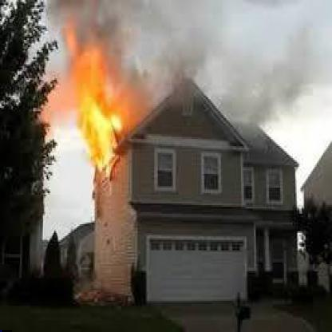

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


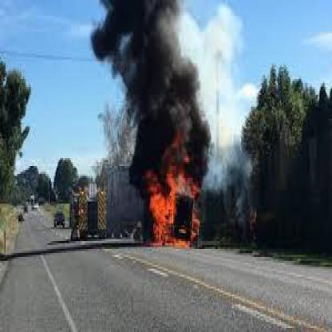

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


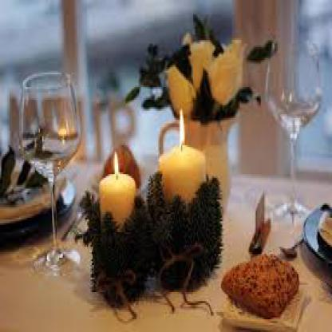

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


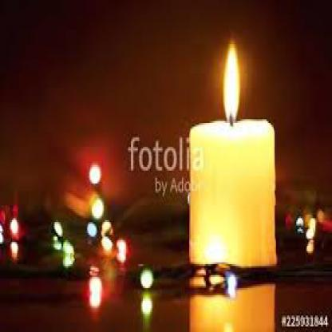

{'instances': Instances(num_instances=2, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[1.2546e-03, 1.3070e-02, 7.6053e-01, 2.5264e+00],
        [3.0518e-03, 4.1458e+02, 3.0670e+00, 4.1600e+02]], device='cuda:0')), scores: tensor([0.0101, 0.0094], device='cuda:0'), pred_classes: tensor([0, 0], device='cuda:0')])}


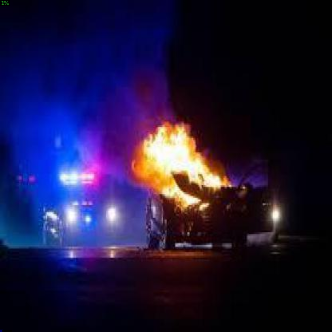

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


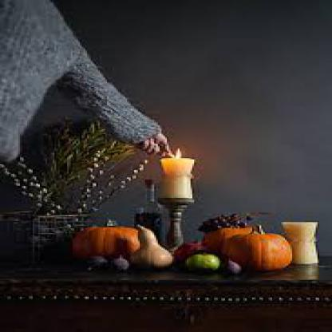

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[1.2854e-03, 1.3878e-02, 6.9550e-01, 2.6328e+00]], device='cuda:0')), scores: tensor([0.0102], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


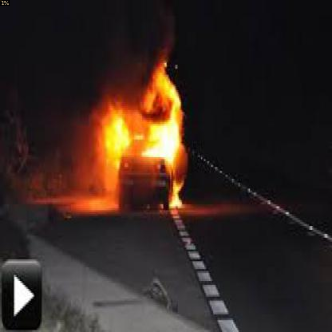

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[5.2367e-03, 1.0604e-03, 1.1992e+00, 2.2300e-01]], device='cuda:0')), scores: tensor([0.0069], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


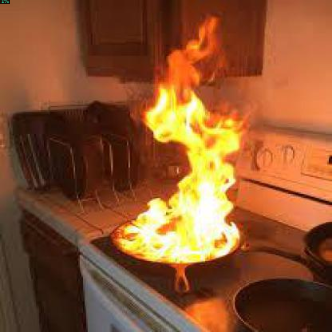

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


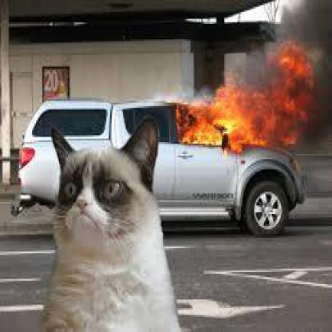

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


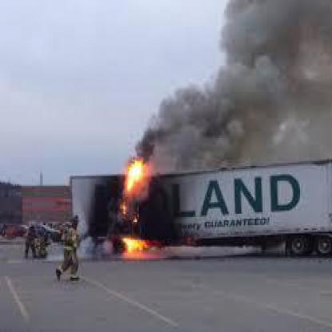

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[0.0032, 0.0151, 1.1669, 2.7879]], device='cuda:0')), scores: tensor([0.0062], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


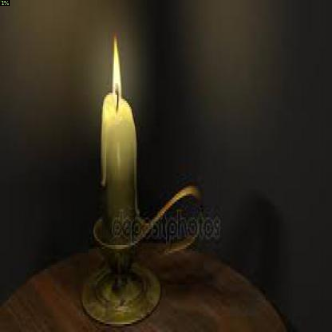

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


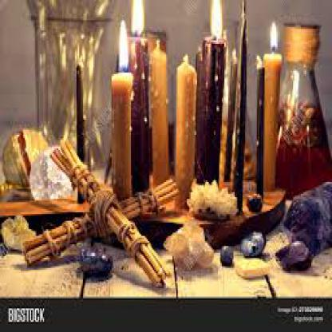

{'instances': Instances(num_instances=2, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[285.1664, 228.1929, 346.1486, 370.0454],
        [195.9194, 244.9306, 256.4315, 377.6838]], device='cuda:0')), scores: tensor([0.0617, 0.0084], device='cuda:0'), pred_classes: tensor([0, 0], device='cuda:0')])}


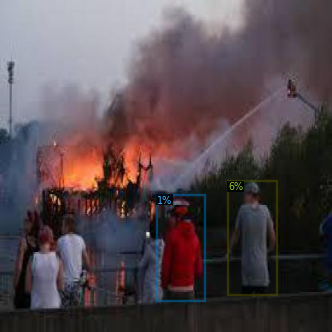

{'instances': Instances(num_instances=2, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[6.2806e-04, 1.0637e-02, 1.8255e-01, 2.5975e+00],
        [3.3246e-03, 4.1547e+02, 2.5730e+00, 4.1600e+02]], device='cuda:0')), scores: tensor([0.0077, 0.0072], device='cuda:0'), pred_classes: tensor([0, 0], device='cuda:0')])}


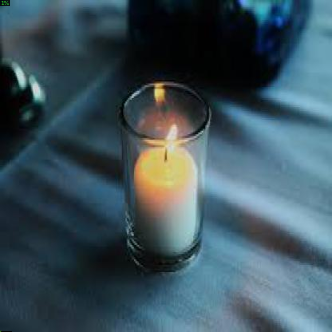

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


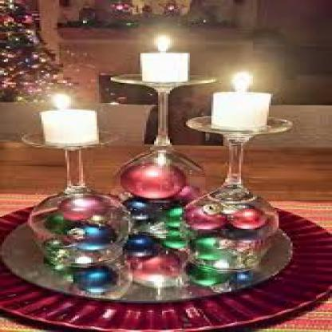

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


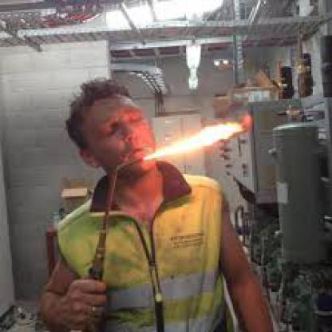

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


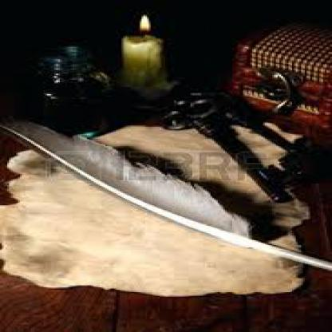

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


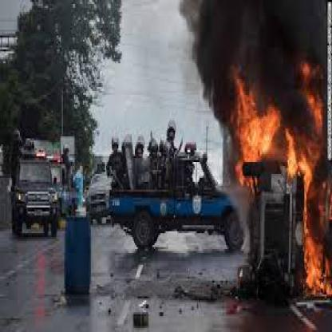

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[1.0760e-03, 1.1434e-02, 4.3201e-01, 2.9417e+00]], device='cuda:0')), scores: tensor([0.0132], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


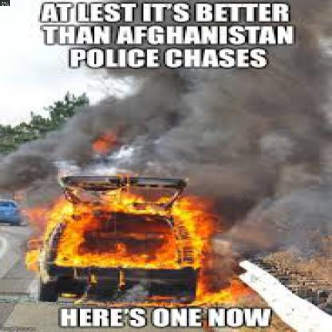

{'instances': Instances(num_instances=0, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


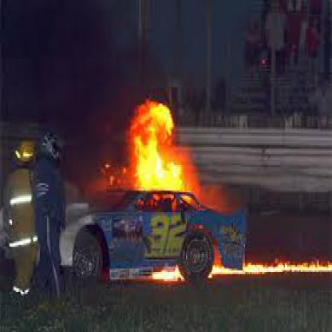

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[4.3862e-03, 1.5135e-05, 9.1044e-01, 4.4362e-03]], device='cuda:0')), scores: tensor([0.0074], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


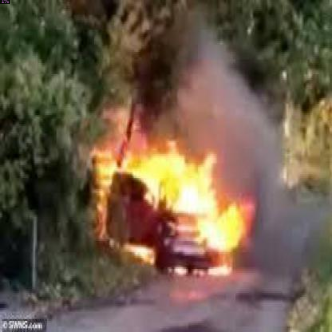

{'instances': Instances(num_instances=1, image_height=416, image_width=416, fields=[pred_boxes: Boxes(tensor([[7.1309e-03, 4.1430e+02, 3.2523e+00, 4.1600e+02]], device='cuda:0')), scores: tensor([0.0052], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


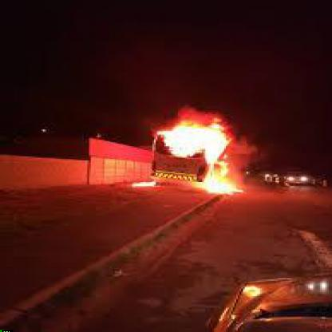

In [18]:
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.005   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")
from detectron2.utils.visualizer import ColorMode
import glob
for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  print(outputs)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])